In [86]:
import numpy as np
from smt.surrogate_models import KRG, RBF
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable
from sklearn.preprocessing import MinMaxScaler
import tensorflow as tf
from sklearn.svm import SVR
from sklearn.model_selection import RandomizedSearchCV
import keras
from keras import layers
import keras_tuner


In [87]:
df = pd.read_csv('Monte_Carlo_10000/training_data_bending.csv')

In [88]:
X = df[['outer_wall_thickness', 'inside_wall_side_thickness', 'inside_wall_middle_thickness', 'height', 'width', 'sigma0', 'youngs']].values
Y = df[['max_force']].values

In [89]:
X_train, X_val, Y_train, Y_val = train_test_split(X, Y, test_size=0.2, random_state=42)
Y_train = Y_train.ravel()
Y_val = Y_val.ravel()
scaler = MinMaxScaler()
X_train = scaler.fit_transform(X_train)
X_val = scaler.transform(X_val)

In [90]:
C_values = np.linspace(1, 1000, num=100)
epsilon_values = np.logspace(-5, 3, num=100)
gamma_values = np.logspace(-5, 4, num=100)
kernel_values = ['linear', 'rbf', 'sigmoid']

In [91]:
values = []
for i in range(100000):
    if i%1000 == 0:
        print(str(int(i/1000)) + '%' + ' finished')
    C = np.random.choice(C_values)
    epsilon = np.random.choice(epsilon_values)
    gamma = np.random.choice(gamma_values)
    kernel = np.random.choice(kernel_values)

    svr = SVR(kernel='rbf', C=C, epsilon=epsilon, gamma=gamma)
    svr.fit(X_train, Y_train)
    Y_pred = svr.predict(X_val)
    mse = mean_squared_error(Y_val, Y_pred)
    mape = mean_absolute_percentage_error(Y_val, Y_pred)
    values.append([mse, mape, epsilon, C, gamma])

0% finished
1% finished
2% finished
3% finished
4% finished
5% finished
6% finished
7% finished
8% finished
9% finished
10% finished
11% finished
12% finished
13% finished
14% finished
15% finished
16% finished
17% finished
18% finished
19% finished
20% finished
21% finished
22% finished
23% finished
24% finished
25% finished
26% finished
27% finished
28% finished
29% finished
30% finished
31% finished
32% finished
33% finished
34% finished
35% finished
36% finished
37% finished
38% finished
39% finished
40% finished
41% finished
42% finished
43% finished
44% finished
45% finished
46% finished
47% finished
48% finished
49% finished
50% finished
51% finished
52% finished
53% finished
54% finished
55% finished
56% finished
57% finished
58% finished
59% finished
60% finished
61% finished
62% finished
63% finished
64% finished
65% finished
66% finished
67% finished
68% finished
69% finished
70% finished
71% finished
72% finished
73% finished
74% finished
75% finished
76% finished
77% finis

In [92]:
values = np.array(values)
# Create a csv file of values
data = pd.DataFrame(values, columns=['mse', 'mape', 'epsilon', 'C', 'gamma'])
min_mse = data['mape'].min()
print("MAPE, for SVR:", format(round(float(min_mse), 4)*100,'.2f'), "%")
print("Best parameters for SVR:")
print("Epsilon:", float(data['epsilon'][data['mape'].idxmin()]))
print("C:", format(float(data['C'][data['mape'].idxmin()]), '.0f'))
print("Gamma:", float(data['gamma'][data['mape'].idxmin()]))
"""print("Kernel:", data['kernel'][data['mape'].idxmin()])
"""#data = data.sort_values(by='C')


MAPE, for SVR: 0.27 %
Best parameters for SVR:
Epsilon: 1.2045035402587812e-05
C: 738
Gamma: 0.01


'print("Kernel:", data[\'kernel\'][data[\'mape\'].idxmin()])\n'

In [93]:
"""# Fit a polynomial of degree 2 (quadratic) or another degree based on the trend you observe
coefficients = np.polyfit(data['C'], np.log10(data['mse']), deg=100)  # Adjust 'deg' as needed
polynomial = np.poly1d(coefficients)

# Create a range of x-values for plotting the fitted line
x_values = np.linspace(data['C'].min(), data['C'].max(), 100)
y_values = 10**polynomial(x_values)  # Convert back from log10 if your y-axis is log-scale

# Calculate the minimum MSE and find corresponding C value
min_mse_index = data['mse'].idxmin()
min_c = data['C'][min_mse_index]
min_mse = data['mse'][min_mse_index]

# Existing plot code
plt.figure(figsize=(10, 6))
plt.plot(data['C'], data['mse'], lw=4)  # Existing line plot

# Highlight the minimum value with a red dot
plt.plot(min_c, min_mse, 'ro', markersize=12)  # s is the size of the dot
plt.annotate(f'({min_c:.0f}, {min_mse:.2f})', xy=(min_c, min_mse), xytext=(min_c-5, min_mse+0.004), fontsize=18)

# Set labels and title
plt.xlabel('C', fontsize=18)
plt.ylabel('MSE', fontsize=18)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.yscale('log')
plt.grid(True)
plt.show()"""

"# Fit a polynomial of degree 2 (quadratic) or another degree based on the trend you observe\ncoefficients = np.polyfit(data['C'], np.log10(data['mse']), deg=100)  # Adjust 'deg' as needed\npolynomial = np.poly1d(coefficients)\n\n# Create a range of x-values for plotting the fitted line\nx_values = np.linspace(data['C'].min(), data['C'].max(), 100)\ny_values = 10**polynomial(x_values)  # Convert back from log10 if your y-axis is log-scale\n\n# Calculate the minimum MSE and find corresponding C value\nmin_mse_index = data['mse'].idxmin()\nmin_c = data['C'][min_mse_index]\nmin_mse = data['mse'][min_mse_index]\n\n# Existing plot code\nplt.figure(figsize=(10, 6))\nplt.plot(data['C'], data['mse'], lw=4)  # Existing line plot\n\n# Highlight the minimum value with a red dot\nplt.plot(min_c, min_mse, 'ro', markersize=12)  # s is the size of the dot\nplt.annotate(f'({min_c:.0f}, {min_mse:.2f})', xy=(min_c, min_mse), xytext=(min_c-5, min_mse+0.004), fontsize=18)\n\n# Set labels and title\nplt.xl

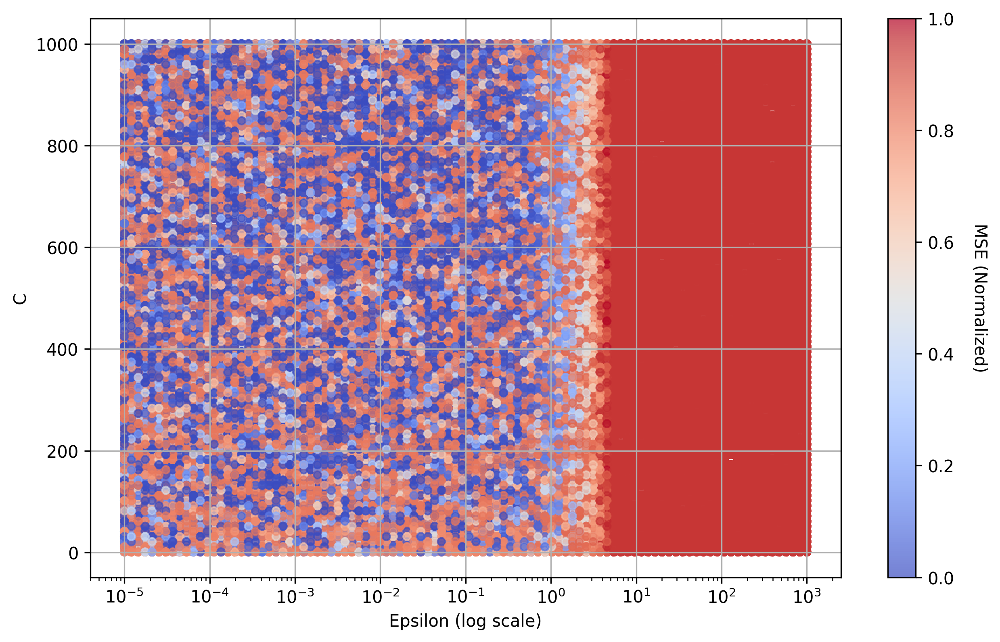

In [94]:
# Normalize the 'mse' column for color mapping
mse_normalized = (data['mse'] - data['mse'].min()) / (data['mse'].max() - data['mse'].min())

# Create a colormap object
cmap = plt.cm.coolwarm  # Use any other colormap if you prefer

# Create a color map from blue to red using the colormap object
colors = cmap(mse_normalized)

# Plotting
plt.figure(figsize=(10, 6), dpi=300)
scatter = plt.scatter(data['epsilon'], data['C'], c=mse_normalized, cmap=cmap, alpha=0.7, s=20)
plt.xscale('log')  # Set the x-axis to a logarithmic scale
colorbar = plt.colorbar(scatter, label='MSE (Normalized)')  # Add a color bar to the plot to indicate color scale
colorbar.set_label('MSE (Normalized)', rotation=270, labelpad=20)
plt.xlabel('Epsilon (log scale)')  # Label for x-axis
plt.ylabel('C')  # Label for y-axis
plt.grid(True)  # Show grid lines
plt.show()  # Display the plot


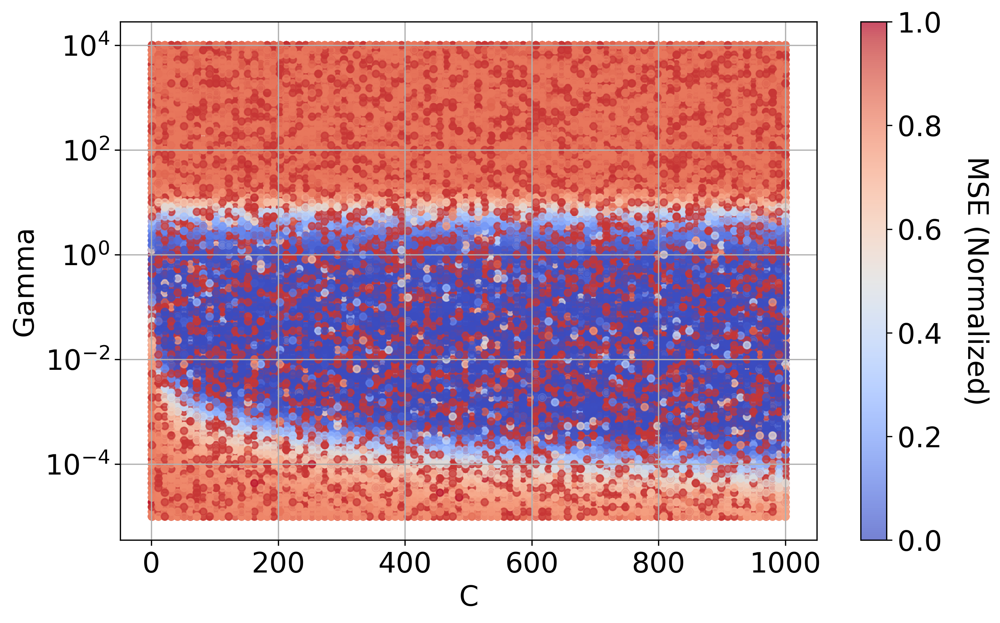

In [95]:
# Normalize the 'mse' column for color mapping
mse_normalized = (data['mse'] - data['mse'].min()) / (data['mse'].max() - data['mse'].min())

# Create a colormap object
cmap = plt.cm.coolwarm  # Use any other colormap if you prefer

# Create a color map from blue to red using the colormap object
colors = cmap(mse_normalized)

# Plotting
plt.figure(figsize=(10, 6), dpi=300)
scatter = plt.scatter(data['C'], data['gamma'], c=mse_normalized, cmap=cmap, alpha=0.7, s=20)
plt.yscale('log')  # Set the y-axis to a logarithmic scale
colorbar = plt.colorbar(scatter, label='MSE (Normalized)')  # Add a color bar to the plot to indicate color scale
colorbar.set_label('MSE (Normalized)', rotation=270, labelpad=30, fontsize=18)  # Adjust fontsize as needed
for label in colorbar.ax.get_yticklabels():
    label.set_size(18)
plt.xlabel('C', fontsize=18)  # Label for x-axis
plt.ylabel('Gamma', fontsize=18)  # Label for y-axis
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.grid(True)  # Show grid lines
plt.show()  # Display the plot

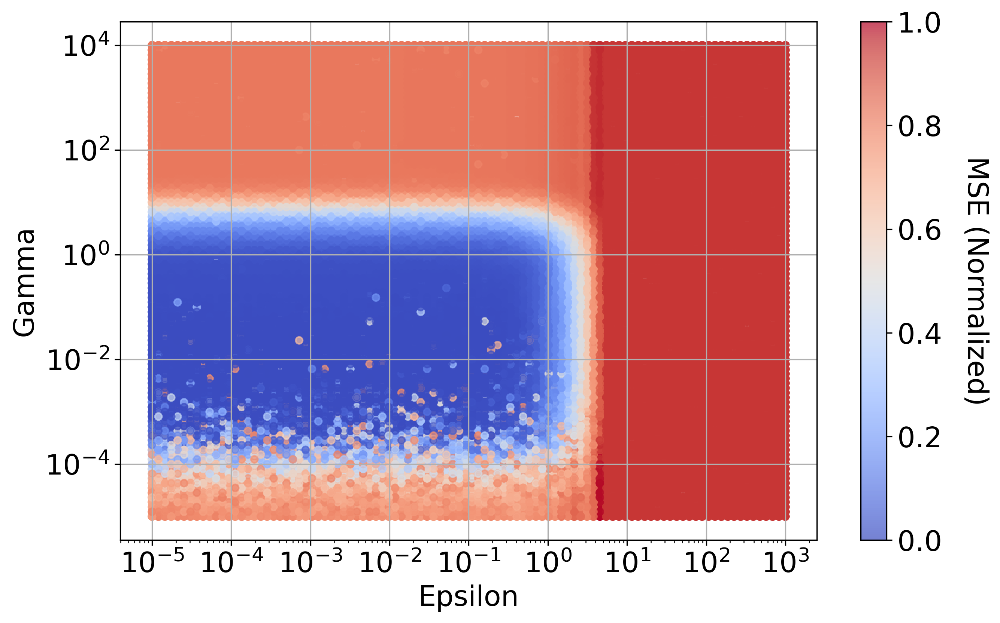

In [96]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Normalize the 'mse' column for color mapping
mse_normalized = (data['mse'] - data['mse'].min()) / (data['mse'].max() - data['mse'].min())

# Create a colormap object
cmap = plt.cm.coolwarm  # Use any other colormap if you prefer

# Create a color map from blue to red using the colormap object
colors = cmap(mse_normalized)

# Plotting
plt.figure(figsize=(10, 6), dpi=300)
scatter = plt.scatter(data['epsilon'], data['gamma'], c=mse_normalized, cmap=cmap, alpha=0.7, s=20)
plt.xscale('log')  # Set the x-axis to a logarithmic scale
plt.yscale('log')  # Set the x-axis to a logarithmic scale
colorbar = plt.colorbar(scatter, label='MSE (Normalized)')  # Add a color bar to the plot to indicate color scale
colorbar.set_label('MSE (Normalized)', rotation=270, labelpad=30, fontsize=18)  # Adjust fontsize as needed
for label in colorbar.ax.get_yticklabels():
    label.set_size(18)
plt.xlabel('Epsilon', fontsize=18)  # Label for x-axis
plt.ylabel('Gamma', fontsize=18)  # Label for y-axis
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.grid(True)  # Show grid lines
plt.show()  # Display the plot

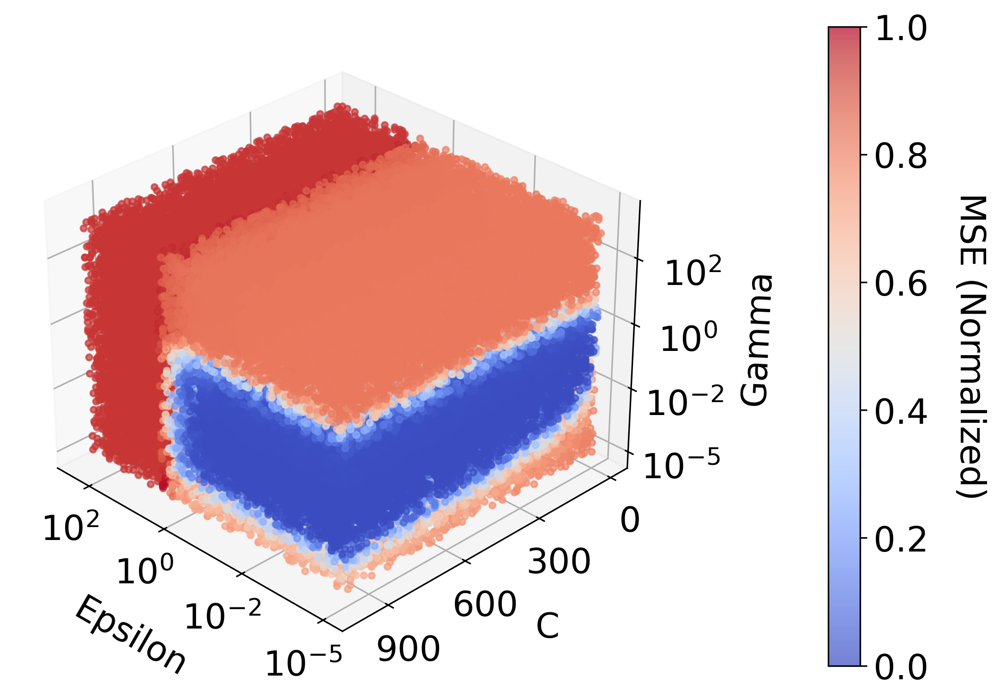

In [97]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.ticker import FuncFormatter, MaxNLocator
import numpy as np

# Function to format the ticks as powers of ten for logarithmic axes
def format_ticks(log_value, pos):
    return r'$10^{%d}$' % int(log_value)

# Load or generate your data here
x = data['epsilon']
y = data['C']
z = data['gamma']
mse_normalized = (data['mse'] - data['mse'].min()) / (data['mse'].max() - data['mse'].min())

# Apply logarithmic transformation only to 'epsilon' and 'gamma'
log_x = np.log10(x)
log_z = np.log10(z)

# Creating a figure
fig = plt.figure(figsize=(18, 6), dpi=300)

# Adding a subplot for 3D plot
ax = fig.add_subplot(111, projection='3d')

# Creating the scatter plot with transformed data
# Note: 'y' is not transformed as it should remain linear
scatter = ax.scatter(log_x, y, log_z, c=mse_normalized, cmap='coolwarm', marker='o', s=10, alpha=0.7)

# Adding a color bar which maps values to colors
cbar = plt.colorbar(scatter, ax=ax, pad=0.1)
cbar.set_label('MSE (Normalized)', rotation=270, labelpad=30, fontsize=18)
cbar.ax.tick_params(labelsize=18)


# Setting tick parameters for the axes
# Apply MaxNLocator to control the number of ticks on each axis
ax.xaxis.set_major_locator(MaxNLocator(4))
ax.yaxis.set_major_locator(MaxNLocator(4))
ax.zaxis.set_major_locator(MaxNLocator(4))

# Applying FuncFormatter only to logarithmic axes
ax.xaxis.set_major_formatter(FuncFormatter(format_ticks))
ax.zaxis.set_major_formatter(FuncFormatter(format_ticks))

# Linear y-axis does not need log formatting
ax.yaxis.set_major_formatter(FuncFormatter(lambda v, pos: f'{int(v)}'))

# Setting labels with specified font sizes
ax.set_xlabel('Epsilon', fontsize=18, labelpad=16)
ax.set_ylabel('C', fontsize=18, labelpad=12)
ax.set_zlabel('Gamma', fontsize=18, labelpad=16)

# Setting tick label sizes
ax.tick_params(axis='both', which='major', labelsize=18)
ax.tick_params(axis='z', which='major', pad=8, labelsize=18)  # Increase pad to avoid collision


# Adjusting subplot positioning
plt.subplots_adjust(left=0.2)

# Setting the view angle for better visualization
ax.view_init(elev=30, azim=135)

# Showing the plot
plt.show()


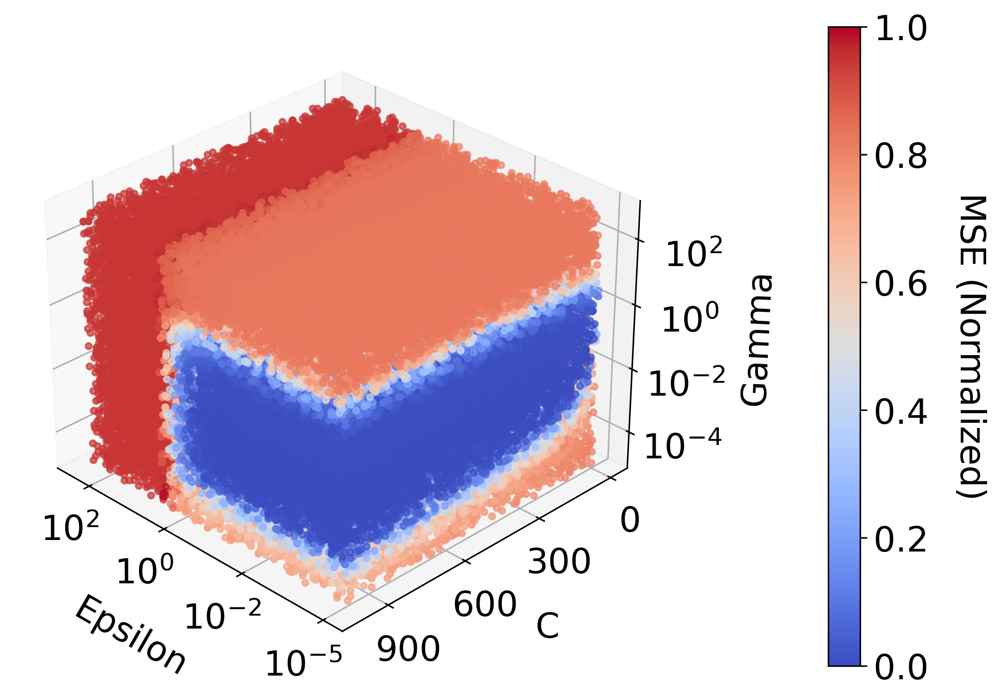

In [113]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.ticker import FuncFormatter, MaxNLocator
from matplotlib.colors import Normalize
import numpy as np

# Function to format the ticks as powers of ten for logarithmic axes
def format_ticks(log_value, pos):
    return r'$10^{%d}$' % int(log_value)

# Load or generate your data here
x = data['epsilon']
y = data['C']
z = data['gamma']
mse_normalized = (data['mse'] - data['mse'].min()) / (data['mse'].max() - data['mse'].min())

# Apply logarithmic transformation only to 'epsilon' and 'gamma'
log_x = np.log10(x)
log_z = np.log10(z)

# Normalize the MSE values for coloring
norm = Normalize(vmin=mse_normalized.min(), vmax=mse_normalized.max())

# Creating a figure
fig = plt.figure(figsize=(18, 6), dpi=300)

# Adding a subplot for 3D plot
ax = fig.add_subplot(111, projection='3d')

# Create a colormap for the scatter plot
cmap = plt.get_cmap('coolwarm')

# Define a condition to mask out unwanted gamma values
mask = z < 10**3

# Plotting points based on the mask
scatter = ax.scatter(log_x[mask], y[mask], log_z[mask], c=cmap(norm(mse_normalized[mask])), marker='o', s=10, alpha=0.7)

# Adding a color bar which maps values to colors
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax, pad=0.1)
cbar.set_label('MSE (Normalized)', rotation=270, labelpad=30, fontsize=18)
cbar.ax.tick_params(labelsize=18)

# Setting tick parameters for the axes
ax.xaxis.set_major_locator(MaxNLocator(4))
ax.yaxis.set_major_locator(MaxNLocator(4))
ax.zaxis.set_major_locator(MaxNLocator(4))

# Applying FuncFormatter only to logarithmic axes
ax.xaxis.set_major_formatter(FuncFormatter(format_ticks))
ax.zaxis.set_major_formatter(FuncFormatter(format_ticks))

# Linear y-axis does not need log formatting
ax.yaxis.set_major_formatter(FuncFormatter(lambda v, pos: f'{int(v)}'))

# Setting labels with specified font sizes
ax.set_xlabel('Epsilon', fontsize=18, labelpad=16)
ax.set_ylabel('C', fontsize=18, labelpad=12)
ax.set_zlabel('Gamma', fontsize=18, labelpad=16)

# Set the limits for the z-axis to match the specified range
ax.set_zlim(np.log10(0.00001), np.log10(1000))

# Setting tick label size
ax.tick_params(axis='both', which='major', labelsize=18)
ax.tick_params(axis='z', which='major', pad=8, labelsize=18)  # Increase pad to avoid collision

# Adjusting subplot positioning
plt.subplots_adjust(left=0.2)

# Setting the view angle for better visualization
ax.view_init(elev=30, azim=135)

# Showing the plot
plt.show()


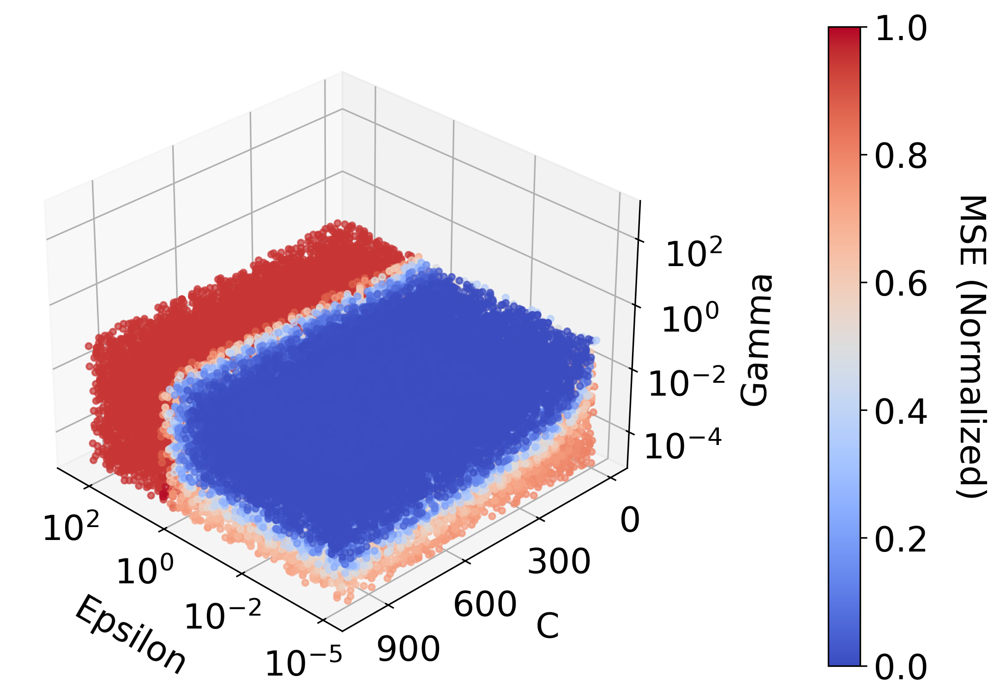

In [112]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.ticker import FuncFormatter, MaxNLocator
from matplotlib.colors import Normalize
import numpy as np

# Function to format the ticks as powers of ten for logarithmic axes
def format_ticks(log_value, pos):
    return r'$10^{%d}$' % int(log_value)

# Load or generate your data here
x = data['epsilon']
y = data['C']
z = data['gamma']
mse_normalized = (data['mse'] - data['mse'].min()) / (data['mse'].max() - data['mse'].min())

# Apply logarithmic transformation only to 'epsilon' and 'gamma'
log_x = np.log10(x)
log_z = np.log10(z)

# Normalize the MSE values for coloring
norm = Normalize(vmin=mse_normalized.min(), vmax=mse_normalized.max())

# Creating a figure
fig = plt.figure(figsize=(18, 6), dpi=300)

# Adding a subplot for 3D plot
ax = fig.add_subplot(111, projection='3d')

# Create a colormap for the scatter plot
cmap = plt.get_cmap('coolwarm')

# Define a condition to mask out unwanted gamma values
mask = z < 0.1

# Plotting points based on the mask
scatter = ax.scatter(log_x[mask], y[mask], log_z[mask], c=cmap(norm(mse_normalized[mask])), marker='o', s=10, alpha=0.7)

# Adding a color bar which maps values to colors
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax, pad=0.1)
cbar.set_label('MSE (Normalized)', rotation=270, labelpad=30, fontsize=18)
cbar.ax.tick_params(labelsize=18)

# Setting tick parameters for the axes
ax.xaxis.set_major_locator(MaxNLocator(4))
ax.yaxis.set_major_locator(MaxNLocator(4))
ax.zaxis.set_major_locator(MaxNLocator(4))

# Applying FuncFormatter only to logarithmic axes
ax.xaxis.set_major_formatter(FuncFormatter(format_ticks))
ax.zaxis.set_major_formatter(FuncFormatter(format_ticks))

# Linear y-axis does not need log formatting
ax.yaxis.set_major_formatter(FuncFormatter(lambda v, pos: f'{int(v)}'))

# Setting labels with specified font sizes
ax.set_xlabel('Epsilon', fontsize=18, labelpad=16)
ax.set_ylabel('C', fontsize=18, labelpad=12)
ax.set_zlabel('Gamma', fontsize=18, labelpad=16)

# Set the limits for the z-axis to match the specified range
ax.set_zlim(np.log10(0.00001), np.log10(1000))

# Setting tick label size
ax.tick_params(axis='both', which='major', labelsize=18)
ax.tick_params(axis='z', which='major', pad=8, labelsize=18)  # Increase pad to avoid collision

# Adjusting subplot positioning
plt.subplots_adjust(left=0.2)

# Setting the view angle for better visualization
ax.view_init(elev=30, azim=135)

# Showing the plot
plt.show()


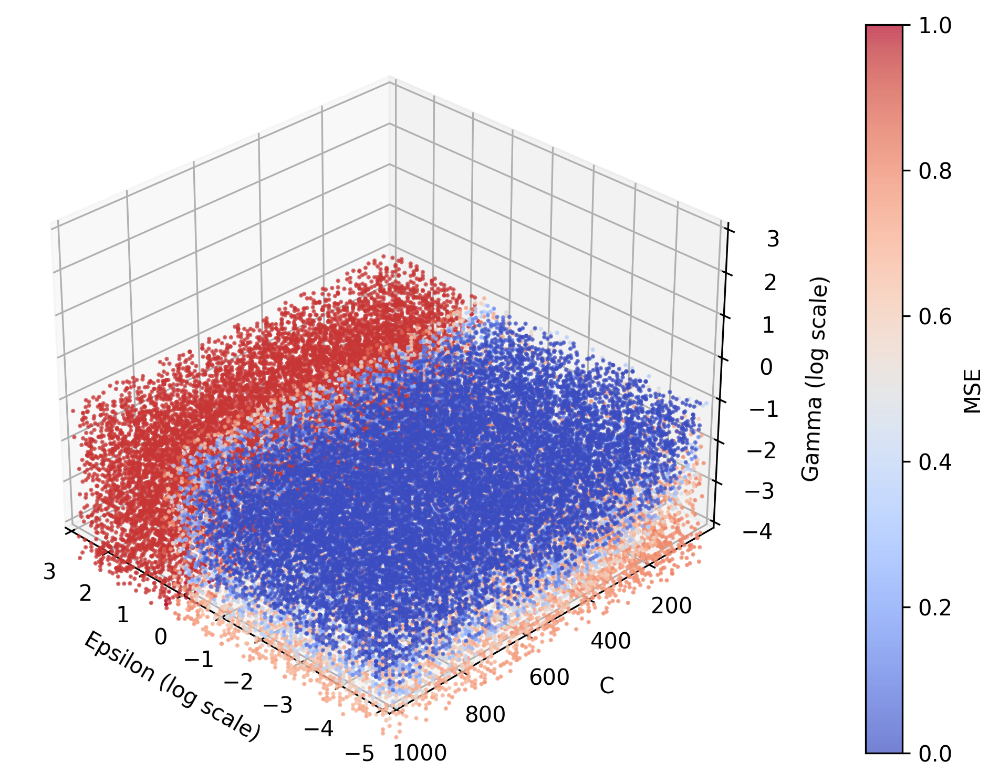

In [101]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np

# Assuming 'data' is your DataFrame with columns 'epsilon', 'C', 'gamma', 'mse'
x = data['epsilon']
y = data['C']
z = data['gamma']
mse_normalized = (data['mse'] - data['mse'].min()) / (data['mse'].max() - data['mse'].min())

# Applying logarithmic transformation to the scales
log_x = np.log10(x)
log_z = np.log10(z)

# Filtering data where log(gamma) is less than -2
below_slice_mask = log_z < -1
x_below = log_x[below_slice_mask]
y_below = y[below_slice_mask]
z_below = log_z[below_slice_mask]
mse_below = mse_normalized[below_slice_mask]

# Creating a figure
fig = plt.figure(figsize=(10, 6), dpi=300)

# Adding a subplot for 3D plot
ax = fig.add_subplot(111, projection='3d')

# Creating the scatter plot with filtered data
scatter = ax.scatter(
    x_below, 
    y_below,
    z_below, 
    c=mse_below, 
    cmap='coolwarm', 
    marker='o', 
    s=1, 
    alpha=0.7
)

# Adding a color bar which maps values to colors
colorbar = plt.colorbar(scatter, ax=ax, label='MSE', pad=0.1)

# Setting labels
ax.set_xlabel('Epsilon (log scale)')
ax.set_ylabel('C')
ax.set_zlabel('Gamma (log scale)')

# Setting the axis limits to include the full original range of log(gamma)
ax.set_xlim([log_x.min(), log_x.max()])
ax.set_ylim([y.min(), y.max()])
ax.set_zlim([-4, 3])  # Full range for log(gamma) from -4 to 3

# Setting the view angle
ax.view_init(elev=30, azim=135)

# Showing the plot
plt.show()


In [102]:
"""space = dict()
space['C'] = np.linspace(1, 100, num=100)
space['epsilon'] = np.logspace(-3, 1, num=100)"""

"space = dict()\nspace['C'] = np.linspace(1, 100, num=100)\nspace['epsilon'] = np.logspace(-3, 1, num=100)"

In [103]:
"""search = RandomizedSearchCV(
    estimator=SVR(kernel='rbf'), 
    param_distributions=space, 
    n_iter=1000, 
    scoring='neg_mean_squared_error', 
    n_jobs=-1,
    random_state=42
)"""

"search = RandomizedSearchCV(\n    estimator=SVR(kernel='rbf'), \n    param_distributions=space, \n    n_iter=1000, \n    scoring='neg_mean_squared_error', \n    n_jobs=-1,\n    random_state=42\n)"

In [104]:
"""result = search.fit(X_train, Y_train)"""

'result = search.fit(X_train, Y_train)'

In [105]:
"""print('Best Score: %s' % result.best_score_)
print('Best Hyperparameters: %s' % result.best_params_)"""

"print('Best Score: %s' % result.best_score_)\nprint('Best Hyperparameters: %s' % result.best_params_)"

In [106]:
SVR_model = SVR(kernel='rbf', C=92, gamma=0.028, epsilon=0.11)
#SVR_model = SVR(kernel='rbf', epsilon=0.01, C=50)
SVR_model.fit(X_train,Y_train)

SVR(C=92, epsilon=0.11, gamma=0.028)

In [107]:
Y_predicted_SVR = SVR_model.predict(X_val)

In [108]:
mse_SVR = mean_squared_error(Y_val, Y_predicted_SVR)
print("MSE, for SVR:", mse_SVR)


MSE, for SVR: 0.010404066747868678


In [109]:
mae_SVR = mean_absolute_error(Y_val, Y_predicted_SVR)
print("MAE, for SVR:", mae_SVR)

MAE, for SVR: 0.08389692918490628


In [110]:
mape_SVR = mean_absolute_percentage_error(Y_val, Y_predicted_SVR)
print("MAPE, for SVR:", format(round(mape_SVR, 4)*100,'.2f'), "%")

MAPE, for SVR: 0.28 %


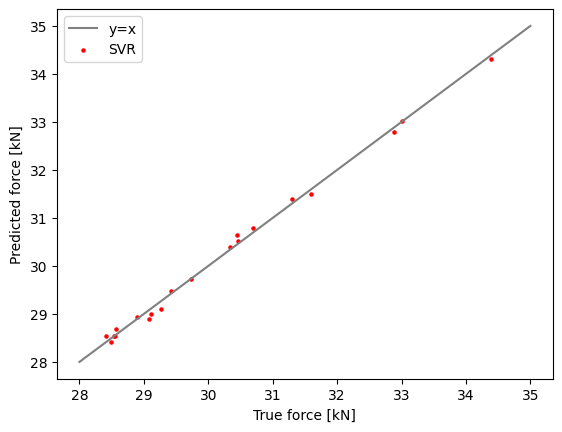

In [111]:
plt.plot([28, 35], [28, 35], label='y=x', color='gray')

plt.scatter(Y_val,Y_predicted_SVR, s=5, label= 'SVR', color='red')

plt.xlabel('True force [kN]')
plt.ylabel('Predicted force [kN]')
plt.legend()